In [1]:
import numpy as np
import sys
import matplotlib.pyplot as plt

### Tối ưu đồng thời hàm Sphere, Ackley, Rosenbrock

Sphere function:
$$
f(x) = \sum_{i=1}^n{x_i^2} \; \; with \;\;x \in R^n
$$ 

Ackley function:
$$
f(x) = -a.exp\Big(-b\sqrt{\frac{1}{d}\sum_{i=1}^d{x_i^2}}\Big)- exp(\frac{1}{d}\sum_{i=1}^dcos(cx_i))+a+exp(1)
$$
Rosenbrock function:
$$
f(x) = \sum_{i = 1}^{n - 1}[100(x_{i + 1} - x_i^2)^2 + (x_i - 1)^2]
$$

***Ở đây ta thêm tham số translation là độ dịch chuyển của x theo hướng [translation] \*  d***
Ví dụ: x = [0, 0, 0] --- translation = 1 ---> [1, 1, 1]

In [2]:
class fnc:
    limited_space = False
    inf_val = None
    sup_val = None
    name = ''

    def __init__(self, d, translation = 0,limited_space: bool = False, inf_val = None, sup_val = None):
        self.d = d
        self.name = self.__class__.__name__ + "_d:"+ str(d) + "_translation:" + str(translation)
        self.translation = translation
        if limited_space == True:
            if inf_val is not None and sup_val is not None:
                self.limited_space = limited_space
                self.inf_val = inf_val
                self.sup_val = sup_val
            else:
                raise Exception("Limitted spacce must have both inf and sup val")

    def decode(self, x):
        x_decoded = x[:self.d]
        if self.limited_space == True:
            x_decoded = x_decoded * (self.sup_val - self.inf_val) + self.inf_val
        x_decoded = x_decoded - self.translation
        return x_decoded

In [3]:
class sphere(fnc):
    def func(self, x):
        x = self.decode(x)
        return np.sum(x**2, axis = 0)

In [4]:
class ackley(fnc):
    a = 20
    b = 0.2
    c = 2*np.pi 
        
    def func(self, x):
        x = self.decode(x)
        return (-self.a * np.exp(-self.b*np.sqrt(np.average(x**2)))
        - np.exp(np.average(np.cos(self.c * x)))
        + self.a
        + np.exp(1)
        )

In [5]:
class rosenbrock(fnc):
    def func(self, x):
        x = self.decode(x)
        l = 100*np.sum((np.delete(x, 0, 0) - np.delete(x, -1, 0 )**2) ** 2)
        r = np.sum((np.delete(x, -1, 0) - 1) ** 2)
        return l + r

In [39]:
print(ackley(3).func(np.array([1, 2, 3, 4, 5])))
print(sphere(3).func(np.array([1, 2, 3])))
print(rosenbrock(3).func(np.array([1, 2, 3])))

7.0164536082694
14
201


In [7]:
print(ackley(3).func(np.array([0, 0, 0])))
print(sphere(3).func(np.array([0, 0, 0])))
print(rosenbrock(3).func(np.array([1, 1, 1])))
print(sphere(3, 200).func(np.array([200, 200, 200])))

4.440892098500626e-16
0
0
0


In [8]:
def population_init(N, num_tasks, d, min_val = 0, max_val = 1):
    '''
    pop.shape = (N * num_tasks, d)
    skill_factor_arr.shape = (N * num_tasks, )
    '''
    pop = np.array([np.random.uniform(min_val, max_val, d) for i in range(N * num_tasks)])
    skill_factor_arr = np.array([[i] * N for i in range(num_tasks)]).reshape(-1, )
    return pop, skill_factor_arr

test_pop, test_ska = population_init(100, 3, 2)
print(test_pop.shape, test_ska.shape)

(300, 2) (300,)


In [9]:
def factorial_cost(pop, skill_factor_arr, tasks = []):
    return np.array([tasks[skill_factor].func(pop[idx_inds]) for idx_inds, skill_factor in enumerate(skill_factor_arr)])

In [10]:
def factorial_rank(f_cost, skill_factor_arr, num_tasks):
    res = np.zeros_like(skill_factor_arr)
    for i in range (num_tasks):
        inds = np.where(skill_factor_arr == i)
        res[inds] = np.argsort(np.argsort(f_cost[inds]))
    return res

In [11]:
def sbx_crossover(pa, pb, nc = 15):
    '''
    pa, pb in [0, 1]^n
    '''
    u = np.random.uniform()
    if u <= 0.5:
        beta = (2*u)**(1/(nc +1))
    else:
        beta = (1/(2 * (1 - u)))**(1 / (1 + nc))
        
    c1 = 0.5*((1 + beta) * pa + (1 - beta) * pb)
    c2 = 0.5*((1 - beta) * pa + (1 + beta) * pb)
    return c1, c2

sbx_crossover(np.array([1, 2, 3]), np.array([7, 4, 3]))

(array([1.06193583, 2.02064528, 3.        ]),
 array([6.93806417, 3.97935472, 3.        ]))

In [12]:
def polynomial_mutation(p, nm = 15):
    '''
    pa, pb in [0, 1]^n
    '''
    u = np.random.rand()
    if u <= 0.5:
        delta_l = (2*u)**(1/(nm + 1)) - 1
        return p + delta_l * p
    
    else: 
        delta_r = 1 - (2*(1-u))**(1/(nm + 1))
        return p + delta_r * (1 - p)

polynomial_mutation(np.array([1, 2, 3]))

array([0.96995211, 1.93990422, 2.90985632])

In [13]:
def gaussian_mutation(p, nm = 15):
    return p + np.random.normal(0, 1, p.shape)
gaussian_mutation(np.array([1, 2, 3]))

array([0.55881157, 2.58494865, 1.97763492])

In [14]:
def MFEA_basic(num_epochs, num_inds_each_task, range_init_pop = [0, 1],tasks = [], rmp = 0.3, nc = 15, nm = 15, mutate = 'polynomial',
                one_line = False, num_epochs_printed = 20, let_p_be_alive:bool = False):
    
    #save history of factorial cost
    history_cost = np.empty((0, len(tasks)), np.float)
    
    max_d = 0
    for t in tasks:
        if max_d < t.d:
            max_d = t.d
    
    # mutation operation
    if mutate == 'polynomial':
        mutation = polynomial_mutation
    elif mutate == 'gaussian':
        mutation = gaussian_mutation
    else:
        raise TypeError

    # initial population and skill_factor_arr
    inf, sup = range_init_pop
    population, skill_factor_arr = population_init(
        N = num_inds_each_task, 
        num_tasks = len(tasks), 
        d = max_d,
        min_val = inf,
        max_val = sup,
    )
    pop_fcost = factorial_cost(population, skill_factor_arr, tasks)

    for epoch in range(num_epochs):
        # selection
        pop_finess = 1/factorial_rank(pop_fcost, skill_factor_arr, len(tasks))
        num_inds_pop = np.int(num_inds_each_task/2)* len(tasks)
        selected_inds = np.argsort(-pop_finess)[:num_inds_pop] 
        population, skill_factor_arr = population[selected_inds], skill_factor_arr[selected_inds]

        #initial offspring for epoch
        offspring = np.empty((0, max_d))
        offspring_skill_factor = np.empty((0, 1), np.int)

        #nums offspring generated for each task
        num_offspring_each_task = np.zeros(len(tasks), np.int)

        # if next_gen = offspring + parent
        if let_p_be_alive == True:
            offspring = population
            offspring_skill_factor = skill_factor_arr

            for i in skill_factor_arr:
                num_offspring_each_task[i] += 1

        while np.all(num_offspring_each_task < num_inds_each_task):
            [idx_a, idx_b] = np.random.randint(num_inds_pop, size = 2)
            [pa, pb], [skf_a, skf_b] = population[[idx_a, idx_b]], skill_factor_arr[[idx_a, idx_b]]

            if skf_a == skf_b:
                # intra - crossover
                ca, cb = sbx_crossover(pa, pb, nc)

                offspring = np.append(offspring, [ca, cb], axis = 0)
                offspring_skill_factor = np.append(offspring_skill_factor, [skf_a, skf_a])
                num_offspring_each_task[skf_a] += 2
            elif np.random.uniform() <= rmp:
                # inter - crossover
                ca, cb = sbx_crossover(pa, pb, nc)

                offspring = np.append(offspring, [ca, cb], axis = 0)
                skf_ca, skf_cb = np.random.choice([skf_a, skf_b], 2, True)
                offspring_skill_factor = np.append(offspring_skill_factor, [skf_ca, skf_cb])
                num_offspring_each_task[skf_ca] += 1
                num_offspring_each_task[skf_cb] += 1
            else:
                # mutation
                ca, cb = mutation(pa, nm), mutation(pb, nm)

                
                offspring = np.append(offspring, [ca, cb], axis = 0)
                offspring_skill_factor = np.append(offspring_skill_factor, [skf_a, skf_b])   
                num_offspring_each_task[skf_a] += 1
                num_offspring_each_task[skf_b] += 1      
        
        #update population, skill factor, factorial cost
        population, skill_factor_arr = offspring, offspring_skill_factor
        pop_fcost = factorial_cost(population, skill_factor_arr, tasks)

        #save history
        history_cost = np.append(history_cost, [[np.min(pop_fcost[np.where(skill_factor_arr == idx)[0]]) for idx in range (len(tasks))]], axis = 0)

        #print
        if (epoch + 1) % (num_epochs // num_epochs_printed) == 0:
            if one_line == True:
                sys.stdout.write('\r')
            sys.stdout.write('Epoch [{}/{}], [%-20s] %3d%% ,func_val: {}'
                .format(epoch + 1, num_epochs,[np.min(pop_fcost[np.where(skill_factor_arr == idx)[0]]) for idx in range (len(tasks))])
                % ('=' * ((epoch + 1) // (num_epochs // 20)) + '>' , (epoch + 1) * 100 // num_epochs)
                )
            if one_line == False:
                print("\n")
            sys.stdout.flush()
    print('END!')
    #find solve
    sol_idx = [np.argmin(pop_fcost[np.where(skill_factor_arr == idx)]) for idx in range (len(tasks))]
    sol = [task.decode(population[np.where(skill_factor_arr == idx)][sol_idx[idx]]) for idx, task in enumerate(tasks)]

    return sol, history_cost

### Tasks dùng để đánh giá kết quả

Bao gồm: 

+ Sphere: d = 30 , $x^{*} = [0]^d$, $F(x^*) = 0$

+ Ackley: d = 50 , $x^{*} = [0]^d$, $F(x^*) = 0$

+ Rosenbrock: d = 20 , $x^{*} = [1]^d$, $F(x^*) = 0$

+ Rosenbrock: d = 30, $x^{*} = [1]^d$, $F(x^*) = 0$

+ Sphere: d = 20 , $x^{*} = [200]^d$, $F(x^*) = 0$

### MFEA_basic: K tasks

+ Khởi tạo quần thể với các giá trị ngẫu nhiên trong khoảng [-100, 100]

+ SBX crossover và Polynomial mutation

$$
\Rarr p_c^k(x, t) = \Big[1 - \frac{0.5.(K - 1).rmp}{K}\Big]. p^k(x, t) + \frac{0.5}{K}\sum_{j \neq k}{rmp.p^j(x, t)} 
$$

In [15]:
tasks1 = [sphere(30), ackley(50), rosenbrock(20), rosenbrock(30), sphere(20, 200)]
sol1, his1 = MFEA_basic(num_epochs= 200,num_inds_each_task= 100, range_init_pop = [-100, 100], tasks = tasks1, rmp = 0.1, nc = 15, nm = 15)

/tmp/ipykernel_184167/1258026113.py:33: RuntimeWarning: divide by zero encountered in true_divide
  pop_finess = 1/factorial_rank(pop_fcost, skill_factor_arr, len(tasks))


Epoch [10/200], [=>                  ]   5% ,func_val: [6329.941755193596, 21.167520482217704, 88561761.06979543, 276295210.5948609, 621238.8723124937]

Epoch [20/200], [==>                 ]  10% ,func_val: [434.90909678116907, 11.80734772249466, 1653076.5323876592, 622893.3133596664, 626416.1442311315]

Epoch [30/200], [===>                ]  15% ,func_val: [41.67877513271825, 6.51317908032523, 11854.324202627191, 7359.984507526323, 636875.6116913235]

Epoch [40/200], [====>               ]  20% ,func_val: [2.392138150461242, 3.4848085568614775, 396.0300129138777, 372.89488896802493, 644041.1647756636]

Epoch [50/200], [=====>              ]  25% ,func_val: [0.33740985608970736, 2.038877764705678, 89.54629720685831, 102.47448315617619, 643522.0359729072]

Epoch [60/200], [======>             ]  30% ,func_val: [0.08174477284712402, 0.4523319859978163, 26.16802177614893, 36.07891659587736, 658624.1772583325]

Epoch [70/200], [=======>            ]  35% ,func_val: [0.030650371831680144,

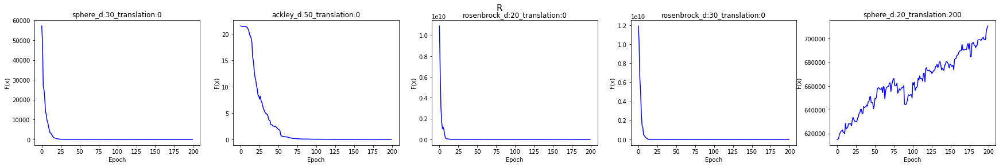

In [16]:
fig = plt.figure(figsize = (30, 4))
fig.suptitle("R\n", size = 15)

for i in range (his1.shape[1]):
    plt.subplot(1, len(tasks1), i + 1)

    plt.plot(np.arange(len(his1)), his1[:, i], "blue")
    plt.title(tasks1[i].name)
    plt.xlabel("Epoch")
    plt.ylabel("F(x)")



#### Kết quả:
+ Đã thấy thuật toán hoạt động.
#### Vấn đề:
+ task 2, 3 bị mắc kẹt không hội tụ được. Tồi tệ hơn khi ở task 4 xuất hiện dấu hiệu tăng. Nguyên nhân vì SBX và polynomial mutation chỉ phù hợp vs cá thể nằm trong khoảng $[0, 1]^d$ vì cả 2 phép biến đổi đều làm cho giá trị p về gần 0 hoặc 1. Do đó nếu điểm tối ưu nằm ngoài khoảng khởi tạo ban đầu và nằm xa khoảng [0, 1] thì sẽ không có sự thúc đẩy rõ ràng để đưa mean về điểm tối ưu.
#### Giải quyết:
+ Mã hóa về không gian chung là $[0, 1]^{max\_d}$ thay vì $R^{max\_d}$

### MFEA_basic with limited space

+ Khởi tạo quần thể với các giá trị ngẫu nhiên trong khoảng [0, 1]

+ SBX crossover và Polynomial mutation

+ ***Không gian biểu diễn nghiệm chung là $[0, 1]^{max\_d}$. Để encode từ không gian nghiệm về không gian nghiệm chung, ta đặt cho không gian biểu diễn giá trị inf_val và sup_val là ước tính chặn trên và dưới của không gian nghiệm.***

In [17]:
tasks2 =    [sphere(30, limited_space= True, inf_val= -100, sup_val= 100), 
            ackley(50, limited_space= True, inf_val= -100, sup_val= 100), 
            rosenbrock(20, limited_space= True, inf_val= -100, sup_val= 100), 
            rosenbrock(30, limited_space= True, inf_val= -100, sup_val= 100), 
            sphere(20, 200, limited_space= True, inf_val= -300, sup_val= 300)
            ]

sol2_15, his2_15 = MFEA_basic(num_epochs= 2000, num_inds_each_task= 100, range_init_pop= [0, 1],tasks = tasks2, rmp = 0.3, nc = 15, nm = 15, one_line=True)
sol2_30, his2_30 = MFEA_basic(num_epochs= 2000, num_inds_each_task= 100, range_init_pop= [0, 1],tasks = tasks2, rmp = 0.3, nc = 30, nm = 30, one_line= True)
sol3_45, his2_45 = MFEA_basic(num_epochs= 2000, num_inds_each_task= 100, range_init_pop= [0, 1],tasks = tasks2, rmp = 0.3, nc = 45, nm = 45, one_line = True)

/tmp/ipykernel_184167/1258026113.py:33: RuntimeWarning: divide by zero encountered in true_divide
  pop_finess = 1/factorial_rank(pop_fcost, skill_factor_arr, len(tasks))


Epoch [2000/2000], [====================>] 100% ,func_val: [0.0052727322640433345, 0.1139921038042897, 0.40141646620371924, 2.3146693598307815, 0.9989084614493353]END!
Epoch [2000/2000], [====================>] 100% ,func_val: [0.11309253962958951, 0.4687948106922275, 3.7619059507105064, 0.5501710716842078, 0.06389903073374105]END!
Epoch [2000/2000], [====================>] 100% ,func_val: [0.02811692158843527, 0.153195183278783, 5.11027464718969, 10.685861395798947, 0.001723523462923481]END!


In [42]:
MFEA_basic(num_epochs= 1000, num_inds_each_task= 100, range_init_pop= [0, 1],tasks = tasks2, rmp = 0.3, nc = 15, nm = 15, one_line=True)

/tmp/ipykernel_184167/1258026113.py:33: RuntimeWarning: divide by zero encountered in true_divide
  pop_finess = 1/factorial_rank(pop_fcost, skill_factor_arr, len(tasks))


Epoch [1000/1000], [====================>] 100% ,func_val: [0.006870757354622396, 0.31577534916647965, 7.205857390746878, 2.970550821369887, 1.7070084988611791]END!


([array([-0.01718637, -0.0103744 ,  0.00651233, -0.00382775, -0.00882886,
         -0.02018807, -0.00783364, -0.00237736,  0.00059132, -0.00400367,
         -0.01864361, -0.02819641,  0.00393776,  0.00319114, -0.01647129,
         -0.00499571, -0.00119104, -0.02570456, -0.0093472 , -0.02736883,
         -0.03071365,  0.01096113, -0.0093727 , -0.01110364, -0.00793516,
         -0.00285343, -0.02118017, -0.02690737,  0.00217478, -0.01885728]),
  array([-0.05348759, -0.0471136 , -0.03116151, -0.04091005, -0.04561651,
         -0.05634672, -0.04470359, -0.03955052, -0.03672808, -0.0411203 ,
         -0.05495307, -0.06394571, -0.03357417, -0.03428717, -0.05285368,
         -0.04201945, -0.03844568, -0.06160738, -0.04616038, -0.06317183,
         -0.06629573, -0.02698319, -0.04617584, -0.04775134, -0.04474391,
         -0.0400401 , -0.0573511 , -0.06270133, -0.03519842, -0.05512683,
         -0.03685666, -0.0628455 , -0.0460942 , -0.04144165, -0.04473466,
         -0.04705193, -0.04930364, -

In [43]:
fig = plt.figure(figsize = (30, 4), dpi= 1000)
fig.suptitle("Limit space\n", size = 15)
fig.set_facecolor("white")

for i in range (len(tasks2)):
    for idx, sub_his in enumerate([his2_15, his2_30, his2_45]): 
        plt.subplot(1, len(tasks2), i + 1)

        plt.plot(np.arange(500), sub_his[500:1000, i], label= 'nm = nc = ' + str((idx + 1) * 15))
        plt.legend()
        

    plt.title(tasks2[i].name)
    plt.xlabel("Epoch")
    plt.ylabel("F(x)")



#### Kết quả:
+ task cuối đã giảm, giải quyết được vấn đề trên

#### Vấn đề:
+ Độ ổn định kém: Do ảnh hưởng của inf_val và sup_val, ảnh hưởng nm và nc lên mỗi task có cường độ khác nhau. Có lẽ sẽ phù hợp hơn nếu nc và nm được thiết kế riêng.
+ Không ước lượng được inf_val và sup_val thì không thể  hội tụ. Chọn quá to sẽ dẫn tới vấn đề 1
+ Rmp cố định, truyền thông tin xấu -> Hội tụ chậm, đồng thời cũng là nguyên nhân ảnh hưởng độ ổn định

#### Giải quyết:
+ Vấn đề 1, 2 thì chịu
+ Vấn đề 3 kì vọng ở MFEA2

### MFEA2: K tasks


Chuyển đổi rmp thành ma trận đối xứng kích thước K*K.

$\Rarr$ Xác suất thực hiện Cross-over giữa 2 cá thể $p_a$ và $p_b$ có skill_factor i và j là $rmp_{ij}$ $\rarr$ $c_a$ và $c_b$ với skill_factor = random_choice( [ i, j ] ) 

Điều kiện của rmp: $rmp_{ii} = 1 \ \forall i \in k$, $0 \leq rmp \leq 1$

$$
\Rarr p_c^k(x, t) = \Big[1 - \frac{0.5}{K}.\sum_{k \neq j}{rmp_{kj}}\Big]. p^k(x, t) + \frac{0.5}{K}\sum_{j \neq k}{rmp_{kj}.p^j(x, t)} 
$$

$\color{orange} \Rarr $ Không làm thay đổi phân phối. Quy ước $p_a$ và $p_b$ khi lai ghép sẽ tuân theo xác suất $rmp_{ij}$ ra 2 cá thể với <span style="color:orange">skill_factor đều  là i</span>. 

$\color{orange} \Rarr $ $rmp_{ij} $ thể hiện mức độ trao đổi truyền từ j tới i. Ở MFEA2 ta có rmp là ma trận đối xứng nên mức độ trao đổi i tới j và j tới i là như nhau.

Cần làm: Tối ưu rmp cho hàm:
$$
max_{rmp} = \sum_{k = 1}^K \sum_{i = 1}^{N/2}log\ g_c^k(x_{ik}, t)
$$


Pseudo code: MFEA2 cho K tasks

Khởi tạo quần thể với N tác vụ mỗi task và skill_factor tương ứng.

While ...:

1. Chọn top N*K/2 quần thể sắp xếp theo scalar_fitness = 1/factor_rank
2. Tìm hàm mật độ phân phối biên của quần thể  với task $k, k \in K$ tạo thành hàm vector $g^k(x, t)$. Để dễ làm thì coi như là phân phối chuẩn - ***Normal Distribution***.
3. train để tìm rmp
4. Crossover + mutate -> offspring
5. cập nhật Population = offspring, skill_factor_arr = ...


In [19]:
import torch
from torch import nn
from torch import optim
from torch.utils.data import Dataset
from torch.utils.data import DataLoader


In [20]:
use_cuda = torch.cuda.is_available() 
device = torch.device("cuda:0" if use_cuda else "cpu")
use_cuda

False

In [21]:
def normal_distribution_func(ind, mu_vector, sigma_vector):
    return 1/(np.sqrt(2) * np.pi * sigma_vector + 1e-10) * np.exp(-1/2 * ((ind - mu_vector)/(sigma_vector + 1e-10)) ** 2)

In [22]:
def probDisVal_forAllInds_eachTask(population, skill_factor_arr, num_tasks):
    # g_tensor_inds is return_val.
    # g_tensor_inds.shape = (num_inds, num_tasks, max_d)
    g_tensor_inds = np.empty((population.shape[0], num_tasks, population.shape[1]))

    '''
    find distribution g
    g[k] (k \in range(K)) is distribution of task k:
        vector (max_d, 2) is \mu and \sigma of each dimension
    '''
    g = np.empty((num_tasks, population.shape[1], 2))

    for k in range(num_tasks):
        idx_k = np.where(skill_factor_arr == k)[0]
        pop_k = population[idx_k]

        # mean (\mu)
        g[k, :, 0] = np.mean(pop_k, axis = 0)
        # standard deviation (\sigma)
        g[k, :, 1] = np.sqrt(np.mean(pop_k**2, axis = 0) - g[k, :, 0]** 2)

        # update prob dis of all inds in task k
        g_tensor_inds[:, k, :] = np.apply_along_axis(normal_distribution_func, 1, population, g[k, :, 0], g[k, :, 1])

    return g_tensor_inds

In [23]:
class opposite_RMP_log_loss_func(nn.Module):
    def __init__(self):
        super(opposite_RMP_log_loss_func, self).__init__()

    def forward(self, gc_in_parents_population):
        # gc_skillFactor_offspring is prob distribution val of each inds of population
        # gc_skillFactor_offspring.shape = (num_inds, max_d)
        # sum of N/2 inds and sum K task = sum K * (N/2) inds
        # because mean and sum have same opt point -> use mean for different batch_sizes
        # size(inds) > 1 => return sum(mean_above) 
        # opposite value => * -1

        return -torch.sum(torch.mean(torch.log(gc_in_parents_population), dim = 0))


In [45]:
'''
============
BUILD MODEL
============
'''
'''
WEIGHT's CONTSTRAINT
--------
weight[i, j | i != j] = 0.5/K rmp[i, j]; weight[i, j | i == j] = 1 - 0.5/K * sum_{i != j} {rmp[i, j]}

=> 0 <= weight[i, j | i != j] <= 0.5/K &&   0.5 < weight[i, j | i == j] <= 1 && torch.sum(weight, dim = 1) == 1

<=> 0 <= weight[i, j | i != j] <= 0.5/K && 1 == torch.sum(weight, dim = 1)
'''    
    
class model_train_rmp(nn.Module):
    def __init__(self, num_tasks, w_is_symetric_matric: bool = False):
        super(model_train_rmp, self).__init__()
        self.num_tasks = num_tasks
        
        '''
        create weight
        -------------
        only weight[r, c | r!= c] requires_grad. 
        => create tensor params requires_grad (i != j)
        weight -> weight requires grad and diagonal_of_w don't require grad
        '''
        self.weight = torch.nn.Parameter(torch.zeros(num_tasks, num_tasks, requires_grad= True))

        self.diagonal_of_w = torch.ones(num_tasks, requires_grad= False)

        self.w_is_symetric_matric = w_is_symetric_matric

    def forward(self, g_tensor_inds, skill_factor_arr):
        ''' 
        g_tensor_inds.shape = (num_inds, num_tasks, max_d)
        -> find gc_in_parents_population
        '''
        gc_in_parents_population = torch.zeros((g_tensor_inds.shape[0], g_tensor_inds.shape[2])).to(device)
        w_copy = torch.clone(self.weight)
        
        # R -> (0, 0.5/K]
        w_copy = 1/(torch.abs(w_copy) + 2*self.num_tasks)

        # diagonal vector constraint
        for i in range (len(w_copy)):
            w_copy[i, i] = 0
        if self.w_is_symetric_matric:
            for j in range(len(w_copy)):
                for i in range(0, j):
                    w_copy[i, j] = w_copy[j, i]

        diag_vec_copy = 1 - torch.sum(w_copy, dim = 1)

        for j in range(self.num_tasks):
            '''
            gc_in_parents_population[idx, :] += g_tensor_inds[idx, j, :] * w_tmp[skill_factor_of_idx, j]
            '''
            for idx, i in enumerate(skill_factor_arr):
                i = int(i)
                if i == j:
                    gc_in_parents_population[idx, :] += g_tensor_inds[idx, i, :] * diag_vec_copy[i]
                elif self.w_is_symetric_matric:
                    # only use half above of matrix => i < j
                    w_tmp = w_copy[i, j]
                    if i > j: 
                        w_tmp = w_copy[j, i]
                    gc_in_parents_population[idx, :] += g_tensor_inds[idx, j, :] * w_tmp
                else:
                    gc_in_parents_population[idx, :] += g_tensor_inds[idx, j, :] * w_copy[i, j]
                
        return gc_in_parents_population
    
    def get_rmp(self):
        '''
        convert weight to rmp
        '''
        # copy weight
        w_copy = torch.clone(self.weight).detach()

        # R -> (0, 0.5/K]
        w_copy = 1/(torch.abs(w_copy) + 2*self.num_tasks)
        if self.w_is_symetric_matric:
            for j in range(len(w_copy)):
                for i in range(0, j):
                    w_copy[i, j] = w_copy[j, i]

        # get rmp:
        rmp = torch.zeros_like(w_copy)
        
        # i != j
        for i in range(self.num_tasks):
            for j in range(self.num_tasks):
                if i != j:
                    rmp[i, j] = w_copy[i, j] * self.num_tasks / 0.5
        # i == j
        for i in range(self.num_tasks):
            rmp[i, i] = 1
        
        return rmp.cpu().detach().numpy()


In [46]:
class BuildDataSet(Dataset):
    def __init__ (self, g_tensor_inds, skill_factor_arr):
        super().__init__()
        self.size = skill_factor_arr.shape[0]
        self.g_tensor_inds = g_tensor_inds
        self.skill_factor_arr = skill_factor_arr
    def __len__(self):
        return self.size

    def __getitem__(self, idx):
        return self.g_tensor_inds[idx], self.skill_factor_arr[idx]

In [47]:
# all var is torch.Tensor
def Train_rmp(num_epochs, model, g_tensor, skf_arr,loss_func, lr, batch_size = 32):
    #convert data to Tensor
    g_tensor_inds, skill_factor_arr = torch.Tensor(g_tensor), torch.Tensor(skf_arr)

    dataset = BuildDataSet(g_tensor_inds, skill_factor_arr)

    model.train()
    optimizer = optim.Adam(model.parameters(), lr)

    loss0 = loss_func(model(g_tensor_inds.to(device), skill_factor_arr.to(device)))

    for epoch in range(num_epochs):
        loaders = DataLoader(dataset, batch_size, shuffle = True)
        for idx, (batch_g_tensor_inds, batch_skill_factor) in enumerate(loaders):
            batch_g_tensor_inds = batch_g_tensor_inds.to(device)
            batch_skill_factor = batch_skill_factor.to(device)

            gc_in_batch = model(batch_g_tensor_inds, batch_skill_factor)
            loss = loss_func(gc_in_batch)

            optimizer.zero_grad()

            loss.backward()
            optimizer.step()

    loss = loss_func(model(g_tensor_inds.to(device), skill_factor_arr.to(device)))
          
    return loss, loss0

In [48]:
#all var is np.array
def MFEA2(num_epochs, num_inds_each_task, range_init_pop = [0, 1], tasks = [], nc = 15, nm = 15, mutate = 'polynomial',
            num_epochs_train_rmp = 10, lr_train_rmp = 1e-3, rmp_is_symetric_matric = False,
            one_line = False,  num_epochs_printed = 20, let_p_be_alive:bool = False):
    
    #save history of factorial cost
    history_cost = np.empty((0, len(tasks)), np.float)
    
    max_d = 0
    for t in tasks:
        if max_d < t.d:
            max_d = t.d

    # mutation operation
    if mutate == 'polynomial':
        mutation = polynomial_mutation
    elif mutate == 'gaussian':
        mutation = gaussian_mutation
    else:
        raise TypeError
    
    # initial population and skill_factor_arr
    inf, sup = range_init_pop
    population, skill_factor_arr = population_init(
        N = num_inds_each_task, 
        num_tasks = len(tasks), 
        d = max_d,
        min_val = inf,
        max_val = sup,
    )

    pop_fcost = factorial_cost(population, skill_factor_arr, tasks)

    # initial model and loss_func for rmp training
    model = model_train_rmp(len(tasks), rmp_is_symetric_matric)
    if use_cuda:
        model = model.cuda()

    loss_func = opposite_RMP_log_loss_func()

    # initial rmp
    rmp = model.get_rmp()
    save_rmp = [rmp]


    for epoch in range(num_epochs):
        # selection
        pop_finess = 1/factorial_rank(pop_fcost, skill_factor_arr, len(tasks))
        num_inds_pop = np.int(num_inds_each_task/2)* len(tasks)
        selected_inds = np.argsort(-pop_finess)[:num_inds_pop].tolist()
        population, skill_factor_arr = population[selected_inds], skill_factor_arr[selected_inds]

        # g_tensor_inds type => numpy.array()
        g_tensor_inds = probDisVal_forAllInds_eachTask(population, skill_factor_arr, len(tasks))

        #train rmp
        loss_after, loss_before = Train_rmp(num_epochs_train_rmp, model, g_tensor_inds, skill_factor_arr, loss_func, lr_train_rmp,32)
        
        # update rmp
        rmp = model.get_rmp()
        save_rmp.append(rmp)

        #initial offspring for epoch
        offspring = np.empty((0, max_d))
        offspring_skill_factor = np.empty((0, 1), np.int)

        #nums offspring generated for each task
        num_offspring_each_task = np.zeros(len(tasks), np.int)

        # if next_gen = offspring + parent
        if let_p_be_alive == True:
            offspring = population
            offspring_skill_factor = skill_factor_arr

            for i in skill_factor_arr:
                num_offspring_each_task[i] += 1

        while (num_offspring_each_task < num_inds_each_task).all():
            #random 2 inds
            [idx_a, idx_b] = np.random.randint(num_inds_pop, size = 2)
            [pa, pb], [skf_a, skf_b] = population[[idx_a, idx_b]], skill_factor_arr[[idx_a, idx_b]]

            if np.random.uniform() <= rmp[skf_a, skf_b]:
                #cross-over
                ca, cb = sbx_crossover(pa, pb, nc)

                offspring = np.append(offspring, [ca, cb], axis = 0)
                offspring_skill_factor = np.append(offspring_skill_factor, [skf_a, skf_a])
                num_offspring_each_task[skf_a] += 2
            else:
                # mutation
                ca, cb = mutation(pa, nm), mutation(pb, nm)
                
                offspring = np.append(offspring, [ca, cb], axis = 0)
                offspring_skill_factor = np.append(offspring_skill_factor, [skf_a, skf_b])   
                num_offspring_each_task[skf_a] += 1
                num_offspring_each_task[skf_b] += 1      

        #update population, skill factor, factorial cost
        population, skill_factor_arr = offspring, offspring_skill_factor
        pop_fcost = factorial_cost(population, skill_factor_arr, tasks)

        #save history
        history_cost = np.append(history_cost, [[np.min(pop_fcost[np.where(skill_factor_arr == idx)[0]]) for idx in range (len(tasks))]], axis = 0)

        #print
        if (epoch + 1) % (num_epochs // num_epochs_printed) == 0:
            if one_line == True:
                sys.stdout.write('\r')
            sys.stdout.write('Epoch [{:{}}/{}], [%-21s] %3d%% ,rmp_loss: {:.5f} -> {:.5f}, func_val: {}'
                .format(epoch + 1, len(str(num_epochs)),num_epochs, loss_before, loss_after, [np.min(pop_fcost[np.where(skill_factor_arr == idx)[0]]) for idx in range (len(tasks))])
                % ('=' * ((epoch + 1) // (num_epochs // 20)) + '>' , (epoch + 1) * 100 // num_epochs)
                )
            if one_line == False:
                print("\n")
            sys.stdout.flush()

    print('END!')
    #find solve
    sol_idx = [np.argmin(pop_fcost[np.where(skill_factor_arr == idx)]) for idx in range (len(tasks))]
    sol = [task.decode(population[np.where(skill_factor_arr == idx)][sol_idx[idx]]) for idx, task in enumerate(tasks)]
    save_rmp.append(rmp)

    return sol, history_cost, save_rmp
        

In [49]:
sol_mfea2, his_mfea2, rmp = MFEA2(1200, 100, range_init_pop= [0, 1], tasks = tasks2, nc = 45, nm = 45,
        num_epochs_train_rmp = 15, lr_train_rmp = 1e1, rmp_is_symetric_matric=True, let_p_be_alive= False)

/tmp/ipykernel_184167/1174489216.py:48: RuntimeWarning: divide by zero encountered in true_divide
  pop_finess = 1/factorial_rank(pop_fcost, skill_factor_arr, len(tasks))


Epoch [  60/1200], [=>                   ]   5% ,rmp_loss: -99.77109 -> -99.77109, func_val: [25921.464872485707, 21.413056887866315, 3315176170.861238, 4932873435.256477, 723313.2515429194]

Epoch [ 120/1200], [==>                  ]  10% ,rmp_loss: -111.61874 -> -111.61874, func_val: [20150.91209163689, 21.371084766597452, 2309084207.982843, 3091169062.4116397, 722675.5616163554]



KeyboardInterrupt: 

In [ ]:
print(rmp[0], '\n')
print(rmp[1])

[[1.         0.09090909 0.09090909 0.09090909 0.09090909]
 [0.09090909 1.         0.09090909 0.09090909 0.09090909]
 [0.09090909 0.09090909 1.         0.09090909 0.09090909]
 [0.09090909 0.09090909 0.09090909 1.         0.09090909]
 [0.09090909 0.09090909 0.09090909 0.09090909 1.        ]] 

[[1.0000000e+00 1.4951942e-04 1.3564069e-04 1.5530671e-04 5.1475312e-05]
 [1.4951942e-04 1.0000000e+00 1.2975071e-04 1.5283810e-04 5.1620395e-05]
 [1.3564069e-04 1.2975071e-04 1.0000000e+00 1.4614889e-04 5.1503768e-05]
 [1.5530671e-04 1.5283810e-04 1.4614889e-04 1.0000000e+00 5.1467789e-05]
 [5.1475312e-05 5.1620395e-05 5.1503768e-05 5.1467789e-05 1.0000000e+00]]


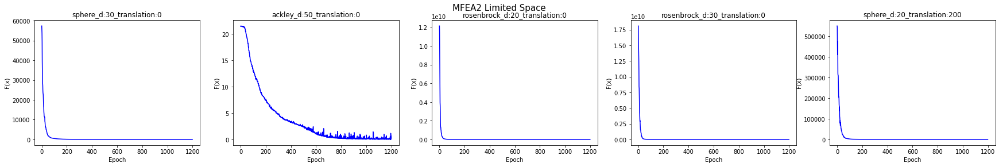

In [ ]:
fig = plt.figure(figsize = (30, 4))
fig.suptitle("MFEA2 Limited Space\n", size = 15)

for i in range (his_mfea2.shape[1]):
    plt.subplot(1, len(tasks1), i + 1)

    plt.plot(np.arange(len(his_mfea2)), his_mfea2[:, i], "blue")
    plt.title(tasks2[i].name)
    plt.xlabel("Epoch")
    plt.ylabel("F(x)")

#### Kết quả:
+ Hội tụ sớm hơn, ổn định hơn.
+ Tốn nhiều thời gian hơn.
#### Vấn đề: 
+ Không nhất thiết phải sử dụng rmp là 1 ma trận đối xứng, sự chuyển giao có thể phân chiều để quần thể tốt trao kiến thức cho quần thể kém, không nhất thiết phải nhận lại trao đổi tương đương.
#### Giải quyết:
+ Phân chiều hướng của cross-over => rmp mất đối xứng.

In [ ]:
sol_mfea2_fake, his_mfea2_fake, rmp = MFEA2(1200, 100, range_init_pop= [0, 1], tasks = tasks2, nc = 45, nm = 45,
        num_epochs_train_rmp = 15, lr_train_rmp = 1e1, rmp_is_symetric_matric=False)

/tmp/ipykernel_184167/2191511876.py:48: RuntimeWarning: divide by zero encountered in true_divide
  pop_finess = 1/factorial_rank(pop_fcost, skill_factor_arr, len(tasks))


Epoch [  60/1200], [=>                   ]   5% ,rmp_loss: -135.84726 -> -135.84749, func_val: [1436.5189090873262, 18.751701315364304, 7191660.476491409, 19835736.50971556, 13594.76083957823]

Epoch [ 120/1200], [==>                  ]  10% ,rmp_loss: -170.75433 -> -170.75435, func_val: [288.3689884715953, 12.149643381057961, 236035.26754167836, 1157282.07910965, 1019.3895819844554]

Epoch [ 180/1200], [===>                 ]  15% ,rmp_loss: -177.58394 -> -177.58394, func_val: [118.36185258341317, 8.372235021569878, 35684.10086911266, 118916.32197324368, 363.3608589531405]

Epoch [ 240/1200], [====>                ]  20% ,rmp_loss: -179.40320 -> -179.40320, func_val: [51.3626693320373, 6.3613631344567025, 7120.879730986657, 19660.80681375884, 171.0589504314185]

Epoch [ 300/1200], [=====>               ]  25% ,rmp_loss: -178.44218 -> -178.44218, func_val: [26.755833375958705, 4.992531086506471, 2274.34603925994, 4361.331472389816, 85.7085214064815]

Epoch [ 360/1200], [======>        

In [ ]:
print(rmp[0], '\n')
print(rmp[1])

[[1.         0.09090909 0.09090909 0.09090909 0.09090909]
 [0.09090909 1.         0.09090909 0.09090909 0.09090909]
 [0.09090909 0.09090909 1.         0.09090909 0.09090909]
 [0.09090909 0.09090909 0.09090909 1.         0.09090909]
 [0.09090909 0.09090909 0.09090909 0.09090909 1.        ]] 

[[1.00000000e+00 1.66606129e-04 1.16762174e-04 1.72074637e-04
  6.43348321e-05]
 [1.88030332e-04 1.00000000e+00 1.24624057e-04 1.85942787e-04
  6.48154819e-05]
 [1.20976802e-04 1.19041128e-04 1.00000000e+00 1.21575205e-04
  6.43067760e-05]
 [1.93655709e-04 1.71853302e-04 1.22701662e-04 1.00000000e+00
  6.44165848e-05]
 [6.43835665e-05 6.44654137e-05 6.43723470e-05 6.43711683e-05
  1.00000000e+00]]


In [ ]:
fig = plt.figure(figsize = (30, 4), dpi= 1000)
fig.suptitle("Limit space\n", size = 15)
fig.set_facecolor("white")

label_legend = [ "MFEA2 Real","MFEA2 Fake", "MFEA1 n = 45"]

for i in range (len(tasks2)):
    for idx, sub_his in enumerate([his_mfea2, his_mfea2_fake]): 
        plt.subplot(1, len(tasks2), i + 1)


        plt.plot(np.arange(len(sub_his)), sub_his[:, i], label= label_legend[idx])
        plt.legend()
        

    plt.title(tasks2[i].name)
    plt.xlabel("Epoch")
    plt.ylabel("F(x)")

In [ ]:
sol_mfea2_fake2, his_mfea2_fake2, rmp = MFEA2(1200, 100, range_init_pop= [0, 1], tasks = tasks2, nc = 45, nm = 45,
        num_epochs_train_rmp = 30, lr_train_rmp = 1e1, rmp_is_symetric_matric=False)

/tmp/ipykernel_184167/2191511876.py:48: RuntimeWarning: divide by zero encountered in true_divide
  pop_finess = 1/factorial_rank(pop_fcost, skill_factor_arr, len(tasks))


Epoch [  60/1200], [=>                   ]   5% ,rmp_loss: -137.01080 -> -137.01093, func_val: [1188.248409138243, 16.12273005250527, 13600419.815491883, 13455073.792712467, 7769.759523820945]

Epoch [ 120/1200], [==>                  ]  10% ,rmp_loss: -173.95039 -> -173.95039, func_val: [305.08041184955783, 10.171412231870152, 344478.64246058743, 683376.3485395453, 1036.3071488353557]

Epoch [ 180/1200], [===>                 ]  15% ,rmp_loss: -176.66803 -> -176.66805, func_val: [100.70307254960888, 7.58157375060963, 47401.527601644775, 172044.95702794104, 322.6147709437933]

Epoch [ 240/1200], [====>                ]  20% ,rmp_loss: -175.83359 -> -175.83359, func_val: [52.239381152736165, 5.5503626590870105, 14772.888880308064, 27734.115605918334, 122.8504855358534]

Epoch [ 300/1200], [=====>               ]  25% ,rmp_loss: -162.39490 -> -162.39490, func_val: [19.520928405903057, 4.426502743917027, 3854.4677945981766, 5380.323116323931, 72.60417936754243]

Epoch [ 360/1200], [======

In [ ]:
print(rmp[0], '\n')
print(rmp[1])

[[1.         0.09090909 0.09090909 0.09090909 0.09090909]
 [0.09090909 1.         0.09090909 0.09090909 0.09090909]
 [0.09090909 0.09090909 1.         0.09090909 0.09090909]
 [0.09090909 0.09090909 0.09090909 1.         0.09090909]
 [0.09090909 0.09090909 0.09090909 0.09090909 1.        ]] 

[[1.0000000e+00 1.4083216e-04 9.2103728e-05 8.9881658e-05 5.0184211e-05]
 [1.5177431e-04 1.0000000e+00 9.4825809e-05 9.3540148e-05 5.0426115e-05]
 [9.2809925e-05 9.3138478e-05 1.0000000e+00 8.9677371e-05 5.0211325e-05]
 [9.2066519e-05 9.1656417e-05 9.0663059e-05 1.0000000e+00 5.0206163e-05]
 [5.0238596e-05 5.0246690e-05 5.0253020e-05 5.0267048e-05 1.0000000e+00]]


In [ ]:
fig = plt.figure(figsize = (30, 4), dpi= 1000)
fig.suptitle("Limit space\n", size = 15)
fig.set_facecolor("white")

label_legend = [ "MFEA2 Real","MFEA2 Fake", "Fake2"]

for i in range (len(tasks2)):
    for idx, sub_his in enumerate([his_mfea2, his_mfea2_fake, his_mfea2_fake2]): 
        plt.subplot(1, len(tasks2), i + 1)


        plt.plot(np.arange(len(sub_his)), sub_his[:, i], label= label_legend[idx])
        plt.legend()
        

    plt.title(tasks2[i].name)
    plt.xlabel("Epoch")
    plt.ylabel("F(x)")

Không có sự cải thiện rõ rệt, có thể vì số lượng cá thể thấp, rmp[i != j] bé => ko bao quát 

In [ ]:
fig = plt.figure(figsize = (30, 4), dpi= 1000)
fig.suptitle("Limit space\n", size = 15)
fig.set_facecolor("white")

label_legend = ["MFEA2 Real", "MFEA2 Fake",  "MFEA1 n = 45"]

for i in range (len(tasks2)):
    for idx, sub_his in enumerate([his_mfea2, his_mfea2_fake, his2_45]): 
        plt.subplot(1, len(tasks2), i + 1)


        plt.plot(np.arange(len(sub_his)), sub_his[:, i], label= label_legend[idx])
        plt.legend()
    
    for idx, sub_his in enumerate([his2_45]): 
        plt.subplot(1, len(tasks2), i + 1)


        plt.plot(np.arange(len(sub_his)), sub_his[:, i], label= label_legend[idx + 2])
        plt.legend()



    plt.title(tasks2[i].name)
    plt.xlabel("Epoch")
    plt.ylabel("F(x)")
    plt.yscale("log")

Kết quả: Hội tụ với ít epochs hơn. Tuy nhiên thời gian tính toán lâu hơn

In [ ]:
np.random.normal(3, 1)

2.2281051192498613